# Udacity Project 4: Wrangle and Analyze Data

### by Pengfei Huangfu

## Table of Content

* Introduction
* Gathering data
* Assessing data
    * Quality
    * Tidiness
* Cleaning data
* Storing, Analyzing, and Visualizing
* Key insights
    * Insight one & visualization
    * Insight two & visualization
    * Insight three & visualization
    * Insight four & visualization

## Introduction

The main goal of this project is to put all skills i learned about wrangling and analyzing data into practice. I will use Python and its libraries to gather data from different type of sources, assess its quality and tidiness, and then clean it. This project will include some interesting data analysis and visulizations.

## Gathering Data

first thing first, let us gather data from different resourse.

In [132]:
# import all necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import requests
import json
import time
import os
import tweepy

%matplotlib inline

In [145]:
#load the csv file directly
twitter_archive = pd.read_csv('twitter-archive-enhanced.csv')
twitter_archive

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421306343426/photo/1,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181378084864/photo/1,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557279858688/photo/1,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",NaN,NaN,NaN,"https://twitter.com/dog_rates/status/891327558926688256/photo/1,https://twitter.com/dog_rates/status/891327558926688256/photo/1",12,10,Franklin,None,None,None,None
5,891087950875897856,NaN,NaN,2017-07-29 00:08:17 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here we have a majestic great white breaching off South Africa's coast. Absolutely h*ckin breathtaking. 13/10 (IG: tucker_marlo) #BarkWeek https://t.co/kQ04fDDRmh,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891087950875897856/photo/1,13,10,None,None,None,None,None
6,890971913173991426,NaN,NaN,2017-07-28 16:27:12 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Meet Jax. He enjoys ice cream so much he gets nervous around it. 13/10 help Jax enjoy more things by clicking below\n\nhttps://t.co/Zr4hWfAs1H https://t.co/tVJBRMnhxl,NaN,NaN,NaN,"https://gofundme.com/ydvmve-surgery-for-jax,https://twitter.com/dog_rates/status/890971913173991426/photo/1",13,10,Jax,None,None,None,None
7,890729181411237888,NaN,NaN,2017-07-28 00:22:40 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",When you watch your owner call another dog a good boy but then they turn back to you and say you're a great boy. 13/10 https://t.co/v0nONBcwxq,NaN,NaN,NaN,"https://twitter.com/dog_rates/status/890729181411237888/photo/1,https://twitter.com/dog_rates/status/890729181411237888/photo/1",13,10,None,None,None,None,None
8,890609185150312448,NaN,NaN,2017-07-27 16:25:51 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Zoey. She doesn't want to be one of the scary sharks. Just wants to be a snuggly pettable boatpet. 13/10 #BarkWeek https://t.co/9TwLuAGH0b,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890609185150312448/photo/1,13,10,Zoey,None,None,None,None
9,89024025534

In [3]:
# information about dataframe twitter_arhive
twitter_archive.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
tweet_id                      2356 non-null int64
in_reply_to_status_id         78 non-null float64
in_reply_to_user_id           78 non-null float64
timestamp                     2356 non-null object
source                        2356 non-null object
text                          2356 non-null object
retweeted_status_id           181 non-null float64
retweeted_status_user_id      181 non-null float64
retweeted_status_timestamp    181 non-null object
expanded_urls                 2297 non-null object
rating_numerator              2356 non-null int64
rating_denominator            2356 non-null int64
name                          2356 non-null object
doggo                         2356 non-null object
floofer                       2356 non-null object
pupper                        2356 non-null object
puppo                         2356 non-null object
dtypes: float64(4), int64(3), ob

**timestamp should not be object, and the format is not readable.**

In [4]:
# Scrape the image predictions file from the Udacity website
url = 'https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv' 
response = requests.get(url)

In [5]:
with open(os.path.join('image_predictions.tsv'), mode = 'wb') as file:
    file.write(response.content);

In [6]:
# load tsv file as a csv    
image_prediction = pd.read_csv('image_predictions.tsv', sep='\t' );

image_prediction.head()

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True


In [7]:
# print information about DataFramce image_prediciton
image_prediction.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
tweet_id    2075 non-null int64
jpg_url     2075 non-null object
img_num     2075 non-null int64
p1          2075 non-null object
p1_conf     2075 non-null float64
p1_dog      2075 non-null bool
p2          2075 non-null object
p2_conf     2075 non-null float64
p2_dog      2075 non-null bool
p3          2075 non-null object
p3_conf     2075 non-null float64
p3_dog      2075 non-null bool
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


**Query the Twitter API for each tweet's JSON data using Python's Tweepy library and store each tweet's entire set of JSON data in a file.**

In [15]:
pip install --user tweepy

In [2]:
import tweepy
from tweepy import OAuthHandler

In [3]:
consumer_key = 'HIDDEN'
consumer_secret = 'HIDDEN'
access_token = 'HIDDEN'
access_secret = 'HIDDEN'

auth = OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_secret)

api = tweepy.API(auth_handler = auth,
                 parser = tweepy.parsers.JSONParser(),
                 wait_on_rate_limit = True,
                wait_on_rate_limit_notify = True)

In [40]:
start_time = time.time()
with open ('tweet_json.txt', 'w') as file:
    for tweet_id in twitter_archive['tweet_id']:
        try:
            tweet = api.get_status(tweet_id, tweet_mode ='extended')
            file.write(json.dumps(tweet) + '\n') # writing one tweet per line
        except Exception as e:
            print("No tweet found for {} with error message {}".format(str(tweet_id),str(e)))
            
end_time = time.time()
print("Whole process finished in {} seconds".format(end_time - start_time))

No tweet found for 888202515573088257 with error message [{'code': 144, 'message': 'No status found with that ID.'}]
No tweet found for 873697596434513921 with error message [{'code': 144, 'message': 'No status found with that ID.'}]
No tweet found for 872668790621863937 with error message [{'code': 144, 'message': 'No status found with that ID.'}]
No tweet found for 872261713294495745 with error message [{'code': 144, 'message': 'No status found with that ID.'}]
No tweet found for 869988702071779329 with error message [{'code': 144, 'message': 'No status found with that ID.'}]
No tweet found for 866816280283807744 with error message [{'code': 144, 'message': 'No status found with that ID.'}]
No tweet found for 861769973181624320 with error message [{'code': 144, 'message': 'No status found with that ID.'}]
No tweet found for 856602993587888130 with error message [{'code': 144, 'message': 'No status found with that ID.'}]
No tweet found for 851953902622658560 with error message [{'code

Rate limit reached. Sleeping for: 460


No tweet found for 754011816964026368 with error message [{'code': 144, 'message': 'No status found with that ID.'}]
No tweet found for 680055455951884288 with error message [{'code': 144, 'message': 'No status found with that ID.'}]


Rate limit reached. Sleeping for: 474


Whole process finished in 2063.098039150238 seconds


In [42]:
df_list = []

with open('tweet_json.txt', 'r') as json_file:
    for line in json_file:
        json_data = json.loads(line)
        
        # Append to list of dictionaries
        df_list.append({'tweet_id': json_data['id'],
                        'retweets': json_data['retweet_count'],
                        'favorites': json_data['favorite_count'],
                        'timestamp': json_data['created_at']})

# Create a DataFrame with tweet ID, retweet count, favorite count and display_text_range
tweet_json = pd.DataFrame(df_list, columns = ['tweet_id', 'retweets', 'favorites', 'timestamp'])

In [43]:
tweet_json

,tweet_id,retweets,favorites,timestamp
0,892420643555336193,7722,36253,Tue Aug 01 16:23:56 +0000 2017
1,892177421306343426,5706,31267,Tue Aug 01 00:17:27 +0000 2017
2,891815181378084864,3782,23541,Mon Jul 31 00:18:03 +0000 2017
3,891689557279858688,7877,39550,Sun Jul 30 15:58:51 +0000 2017
4,891327558926688256,8494,37772,Sat Jul 29 16:00:24 +0000 2017
...,...,...,...,...
2326,666049248165822465,39,96,Mon Nov 16 00:24:50 +0000 2015
2327,666044226329800704,132,272,Mon Nov 16 00:04:52 +0000 2015
2328,666033412701032449,41,112,Sun Nov 15 23:21:54 +0000 2015
2329,666029285002620928,42,121,Sun Nov 15 23:05:30 +0000 2015


## Summary of Gathering Data

Now we have fisnished the first step: data gathering. In this step, we loaded data from varies of resources such as local download, udacity website and quried twitter's API.

## Assessing Data

next, let us assess the data we gathered.

In [130]:
twitter_archive

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421306343426/photo/1,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181378084864/photo/1,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557279858688/photo/1,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",NaN,NaN,NaN,"https://twitter.com/dog_rates/status/891327558926688256/photo/1,https://twitter.com/dog_rates/status/891327558926688256/photo/1",12,10,Franklin,None,None,None,None
5,891087950875897856,NaN,NaN,2017-07-29 00:08:17 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here we have a majestic great white breaching off South Africa's coast. Absolutely h*ckin breathtaking. 13/10 (IG: tucker_marlo) #BarkWeek https://t.co/kQ04fDDRmh,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891087950875897856/photo/1,13,10,None,None,None,None,None
6,890971913173991426,NaN,NaN,2017-07-28 16:27:12 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Meet Jax. He enjoys ice cream so much he gets nervous around it. 13/10 help Jax enjoy more things by clicking below\n\nhttps://t.co/Zr4hWfAs1H https://t.co/tVJBRMnhxl,NaN,NaN,NaN,"https://gofundme.com/ydvmve-surgery-for-jax,https://twitter.com/dog_rates/status/890971913173991426/photo/1",13,10,Jax,None,None,None,None
7,890729181411237888,NaN,NaN,2017-07-28 00:22:40 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",When you watch your owner call another dog a good boy but then they turn back to you and say you're a great boy. 13/10 https://t.co/v0nONBcwxq,NaN,NaN,NaN,"https://twitter.com/dog_rates/status/890729181411237888/photo/1,https://twitter.com/dog_rates/status/890729181411237888/photo/1",13,10,None,None,None,None,None
8,890609185150312448,NaN,NaN,2017-07-27 16:25:51 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Zoey. She doesn't want to be one of the scary sharks. Just wants to be a snuggly pettable boatpet. 13/10 #BarkWeek https://t.co/9TwLuAGH0b,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890609185150312448/photo/1,13,10,Zoey,None,None,None,None
9,89024025534

In [48]:
twitter_archive.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
tweet_id                      2356 non-null int64
in_reply_to_status_id         78 non-null float64
in_reply_to_user_id           78 non-null float64
timestamp                     2356 non-null object
source                        2356 non-null object
text                          2356 non-null object
retweeted_status_id           181 non-null float64
retweeted_status_user_id      181 non-null float64
retweeted_status_timestamp    181 non-null object
expanded_urls                 2297 non-null object
rating_numerator              2356 non-null int64
rating_denominator            2356 non-null int64
name                          2356 non-null object
doggo                         2356 non-null object
floofer                       2356 non-null object
pupper                        2356 non-null object
puppo                         2356 non-null object
dtypes: float64(4), int64(3), ob

**there are missing values in some column.**

In [51]:
# check duplications
twitter_archive.duplicated().sum()

0

In [56]:
twitter_archive.describe

<bound method NDFrame.describe of                 tweet_id  in_reply_to_status_id  in_reply_to_user_id  \
0     892420643555336193                    NaN                  NaN   
1     892177421306343426                    NaN                  NaN   
2     891815181378084864                    NaN                  NaN   
3     891689557279858688                    NaN                  NaN   
4     891327558926688256                    NaN                  NaN   
...                  ...                    ...                  ...   
2351  666049248165822465                    NaN                  NaN   
2352  666044226329800704                    NaN                  NaN   
2353  666033412701032449                    NaN                  NaN   
2354  666029285002620928                    NaN                  NaN   
2355  666020888022790149                    NaN                  NaN   

                      timestamp  \
0     2017-08-01 16:23:56 +0000   
1     2017-08-01 00:17:27 +0000

In [77]:
# check the rating denominator
twitter_archive.rating_denominator.value_counts()

10     2333
11        3
50        3
80        2
20        2
2         1
16        1
40        1
70        1
15        1
90        1
110       1
120       1
130       1
150       1
170       1
7         1
0         1
Name: rating_denominator, dtype: int64

**we have to correct denominators other than 10**

In [78]:
# listing the rows with strange number
check_denominator = twitter_archive.rating_denominator.value_counts().tail(17).index.tolist()

In [100]:
pd.set_option('max_colwidth', 1000)

In [82]:
# print the row with strange numbers in denominator
twitter_archive[twitter_archive['rating_denominator'].isin(check_denominator)]['text']

313                                                                            @jonnysun @Lin_Manuel ok jomny I know you're excited but 960/00 isn't a valid rating, 13/10 is tho
342                                                                                                                                      @docmisterio account started on 11/15/15
433                                                                           The floofs have been released I repeat the floofs have been released. 84/70 https://t.co/NIYC820tmd
516     Meet Sam. She smiles 24/7 &amp; secretly aspires to be a reindeer. \nKeep Sam smiling by clicking and sharing this link:\nhttps://t.co/98tB8y7y7t https://t.co/LouL5vdvxx
784                                  RT @dog_rates: After so many requests, this is Bretagne. She was the last surviving 9/11 search dog, and our second ever 14/10. RIP https:/…
902                                                                                                Why does th

**we found that some rows don't have image of dogs.**

In [59]:
twitter_archive.rating_numerator.value_counts()

12      558
11      464
10      461
13      351
9       158
8       102
7        55
14       54
5        37
6        32
3        19
4        17
1         9
2         9
420       2
0         2
15        2
75        2
80        1
20        1
24        1
26        1
44        1
50        1
60        1
165       1
84        1
88        1
144       1
182       1
143       1
666       1
960       1
1776      1
17        1
27        1
45        1
99        1
121       1
204       1
Name: rating_numerator, dtype: int64

In [747]:
# print those rows with large and odd numbers in numerator.
print(twitter_archive.loc[twitter_archive.rating_numerator == 204, 'text']) 
print(twitter_archive.loc[twitter_archive.rating_numerator == 143, 'text']) 
print(twitter_archive.loc[twitter_archive.rating_numerator == 666, 'text']) 
print(twitter_archive.loc[twitter_archive.rating_numerator == 1776, 'text'])
print(twitter_archive.loc[twitter_archive.rating_numerator == 144, 'text'])

1120    Say hello to this unbelievably well behaved squad of doggos. 204/170 would try to pet all at once https://t.co/yGQI3He3xv
Name: text, dtype: object
1634    Two sneaky puppers were not initially seen, moving the rating to 143/130. Please forgive us. Thank you https://t.co/kRK51Y5ac3
Name: text, dtype: object
189    @s8n You tried very hard to portray this good boy as not so good, but you have ultimately failed. His goodness shines through. 666/10
Name: text, dtype: object
979    This is Atticus. He's quite simply America af. 1776/10 https://t.co/GRXwMxLBkh
Name: text, dtype: object
1779    IT'S PUPPERGEDDON. Total of 144/120 ...I think https://t.co/ZanVtAtvIq
Name: text, dtype: object


In [748]:
# print those rows with large and odd numbers in numerator.
print(twitter_archive.loc[twitter_archive.rating_numerator == 204, 'tweet_id']) 
print(twitter_archive.loc[twitter_archive.rating_numerator == 143, 'tweet_id']) 
print(twitter_archive.loc[twitter_archive.rating_numerator == 666, 'tweet_id']) 
print(twitter_archive.loc[twitter_archive.rating_numerator == 1776, 'tweet_id'])
print(twitter_archive.loc[twitter_archive.rating_numerator == 144, 'tweet_id'])

1120    731156023742988288
Name: tweet_id, dtype: int64
1634    684225744407494656
Name: tweet_id, dtype: int64
189    855860136149123072
Name: tweet_id, dtype: int64
979    749981277374128128
Name: tweet_id, dtype: int64
1779    677716515794329600
Name: tweet_id, dtype: int64


In [87]:
twitter_archive.text

0                                                            This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU
1       This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV
2                        This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB
3                                                                  This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ
4       This is Franklin. He would like you to stop calling him "cute." He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f
                                                                                       ...                                                       

In [101]:
#show all rows
pd.set_option('display.max_rows', None)

In [102]:
twitter_archive['name'].value_counts()

None              745
a                  55
Charlie            12
Cooper             11
Oliver             11
Lucy               11
Penny              10
Lola               10
Tucker             10
Winston             9
Bo                  9
Sadie               8
the                 8
Toby                7
Buddy               7
Daisy               7
an                  7
Bailey              7
Stanley             6
Jax                 6
Bella               6
Koda                6
Leo                 6
Scout               6
Dave                6
Jack                6
Milo                6
Rusty               6
Oscar               6
Louis               5
Sunny               5
Alfie               5
Gus                 5
Larry               5
Sammy               5
George              5
Chester             5
Phil                5
Finn                5
Oakley              5
Bentley             5
very                5
Jeffrey             4
Duke                4
Sampson             4
Maximus   

**Some dogs have name with None, a and an.**

In [134]:
print(twitter_archive['doggo'].value_counts())
print(twitter_archive['floofer'].value_counts())
print(twitter_archive['pupper'].value_counts())
print(twitter_archive['puppo'].value_counts())

None     2259
doggo      97
Name: doggo, dtype: int64
None       2346
floofer      10
Name: floofer, dtype: int64
None      2099
pupper     257
Name: pupper, dtype: int64
None     2326
puppo      30
Name: puppo, dtype: int64


**these four variables suppose to be in one column.**

In [129]:
image_prediction

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,1.566650e-01,True,Shetland_sheepdog,6.142850e-02,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,7.419170e-02,True,Rhodesian_ridgeback,7.201000e-02,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,1.385840e-01,True,bloodhound,1.161970e-01,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,3.606870e-01,True,miniature_pinscher,2.227520e-01,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,2.436820e-01,True,Doberman,1.546290e-01,True
5,666050758794694657,https://pbs.twimg.com/media/CT5Jof1WUAEuVxN.jpg,1,Bernese_mountain_dog,0.651137,True,English_springer,2.637880e-01,True,Greater_Swiss_Mountain_dog,1.619920e-02,True
6,666051853826850816,https://pbs.twimg.com/media/CT5KoJ1WoAAJash.jpg,1,box_turtle,0.933012,False,mud_turtle,4.588540e-02,False,terrapin,1.788530e-02,False
7,666055525042405380,https://pbs.twimg.com/media/CT5N9tpXIAAifs1.jpg,1,chow,0.692517,True,Tibetan_mastiff,5.827940e-02,True,fur_coat,5.444860e-02,False
8,666057090499244032,https://pbs.twimg.com/media/CT5PY90WoAAQGLo.jpg,1,shopping_cart,0.962465,False,shopping_basket,1.459380e-02,False,golden_retriever,7.958960e-03,True
9,666058600524156928,https://pbs.twimg.com/media/CT5Qw94XAAA_2dP.jpg,1,miniature_poodle,0.201493,True,komondor,1.923050e-01,True,soft-coated_wheaten_terrier,8.208610e-02,True


In [105]:
image_prediction.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
tweet_id    2075 non-null int64
jpg_url     2075 non-null object
img_num     2075 non-null int64
p1          2075 non-null object
p1_conf     2075 non-null float64
p1_dog      2075 non-null bool
p2          2075 non-null object
p2_conf     2075 non-null float64
p2_dog      2075 non-null bool
p3          2075 non-null object
p3_conf     2075 non-null float64
p3_dog      2075 non-null bool
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


In [113]:
# check duplicates 
image_prediction.tweet_id.duplicated().sum()

0

In [114]:
# check duplicates 
image_prediction.jpg_url.duplicated().sum()

66

**there are 66 duplicates in jpg_url, we should delete these later.**

In [319]:
# print three types of prediction
print(image_prediction.p1_dog.value_counts())
print(image_prediction.p2_dog.value_counts())
print(image_prediction.p3_dog.value_counts())

True     1532
False     543
Name: p1_dog, dtype: int64
True     1553
False     522
Name: p2_dog, dtype: int64
True     1499
False     576
Name: p3_dog, dtype: int64


In [119]:
print(image_prediction.p1)

0               Welsh_springer_spaniel
1                              redbone
2                      German_shepherd
3                  Rhodesian_ridgeback
4                   miniature_pinscher
5                 Bernese_mountain_dog
6                           box_turtle
7                                 chow
8                        shopping_cart
9                     miniature_poodle
10                    golden_retriever
11                       Gordon_setter
12                        Walker_hound
13                                 pug
14                          bloodhound
15                               Lhasa
16                      English_setter
17                                 hen
18                    desktop_computer
19                   Italian_greyhound
20                         Maltese_dog
21                    three-toed_sloth
22                                  ox
23                    golden_retriever
24                            malamute
25                       

In [120]:
print(image_prediction.p2)

0                               collie
1                   miniature_pinscher
2                             malinois
3                              redbone
4                           Rottweiler
5                     English_springer
6                           mud_turtle
7                      Tibetan_mastiff
8                      shopping_basket
9                             komondor
10                     Tibetan_mastiff
11                   Yorkshire_terrier
12                    English_foxhound
13                        bull_mastiff
14                     German_shepherd
15                            Shih-Tzu
16                        Newfoundland
17                                cock
18                                desk
19                         toy_terrier
20                          toy_poodle
21                               otter
22                        Newfoundland
23            Chesapeake_Bay_retriever
24                      Siberian_husky
25                       

In [122]:
print(image_prediction.p3)

0                    Shetland_sheepdog
1                  Rhodesian_ridgeback
2                           bloodhound
3                   miniature_pinscher
4                             Doberman
5           Greater_Swiss_Mountain_dog
6                             terrapin
7                             fur_coat
8                     golden_retriever
9          soft-coated_wheaten_terrier
10                  Labrador_retriever
11                            Pekinese
12                        Ibizan_hound
13                      French_bulldog
14                            malinois
15                      Dandie_Dinmont
16                              borzoi
17                           partridge
18                            bookcase
19                             basenji
20                    miniature_poodle
21                      great_grey_owl
22                         groenendael
23                  Labrador_retriever
24                          Eskimo_dog
25                       

**some predictions like ice bear and box_turtle are not right.**

In [128]:
tweet_json

,tweet_id,retweets,favorites,timestamp
0,892420643555336193,7722,36253,Tue Aug 01 16:23:56 +0000 2017
1,892177421306343426,5706,31267,Tue Aug 01 00:17:27 +0000 2017
2,891815181378084864,3782,23541,Mon Jul 31 00:18:03 +0000 2017
3,891689557279858688,7877,39550,Sun Jul 30 15:58:51 +0000 2017
4,891327558926688256,8494,37772,Sat Jul 29 16:00:24 +0000 2017
5,891087950875897856,2845,19022,Sat Jul 29 00:08:17 +0000 2017
6,890971913173991426,1852,11077,Fri Jul 28 16:27:12 +0000 2017
7,890729181411237888,17226,61097,Fri Jul 28 00:22:40 +0000 2017
8,890609185150312448,3918,26185,Thu Jul 27 16:25:51 +0000 2017
9,890240255349198849,6706,29916,Wed Jul 26 15:59:51 +0000 2017


In [123]:
tweet_json.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2331 entries, 0 to 2330
Data columns (total 4 columns):
tweet_id     2331 non-null int64
retweets     2331 non-null int64
favorites    2331 non-null int64
timestamp    2331 non-null object
dtypes: int64(3), object(1)
memory usage: 73.0+ KB


**number of rows should be consistent to 2356.there are some missing values**

In [125]:
# check duplicates
tweet_json.tweet_id.duplicated().sum()

0

### Quality Issues

**Completeness, validity, accuracy, consistency (content issues)**

#### twitter_archive
* there are 181 rows having retweets, should be removed
* columns in_reply_to_status_id, in_reply_to_user_id, retweeted_status_id, retweeted_status_user_id, retweeted_status_timestamp and expanded_urls have missing values.
* timestamp should not be object, and the format is not readable.
* rating_denominator has number other than 10.
* rating_numerator has extreme numbers such as 1776.


#### image_predictions
* there are 66 duplicates in jpg_url.
* p1, p2 and p3 have some strange predicted name:ice bear and box-turtle. create new columns for prediction and confidence level.
* delete columns no longer needed for further analysis.
* the number of rows in image_predictions should be consistent with twitter_archive. therefore, the number of row should be 2356 instead of 2075.

#### tweet_json
* the number of rows in image_predictions should be 2356 instead of 2331.

### Tideness

**(structure issue)**

* columns 'doggo','floofer','pupper' and 'puppo' should be in one column instead of four.
* all three dataset should be from same database and have same number of rows.



## Cleaning data

### Quality

### twitter_archive
after assessing data we gathered, next, i am going to clean all three datasets.

In [690]:
# make copies of dataframe
twitter_archive_clean = twitter_archive.copy()
image_predictions_clean = image_prediction.copy()
tweet_json_clean = tweet_json.copy()

#### Define

1. Remove retweets data (duplicated) 

#### Code


In [691]:
# keep the columns without retweets
twitter_archive_clean = twitter_archive_clean[np.isnan(twitter_archive_clean.retweeted_status_id)]

#### Test

In [692]:
twitter_archive_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2175 entries, 0 to 2355
Data columns (total 17 columns):
tweet_id                      2175 non-null int64
in_reply_to_status_id         78 non-null float64
in_reply_to_user_id           78 non-null float64
timestamp                     2175 non-null object
source                        2175 non-null object
text                          2175 non-null object
retweeted_status_id           0 non-null float64
retweeted_status_user_id      0 non-null float64
retweeted_status_timestamp    0 non-null object
expanded_urls                 2117 non-null object
rating_numerator              2175 non-null int64
rating_denominator            2175 non-null int64
name                          2175 non-null object
doggo                         2175 non-null object
floofer                       2175 non-null object
pupper                        2175 non-null object
puppo                         2175 non-null object
dtypes: float64(4), int64(3), object(1

In [693]:
sum(twitter_archive_clean.retweeted_status_user_id.value_counts())

0

#### Define
2.delete columns that are no longer needed. these columns are:columns in_reply_to_status_id, in_reply_to_user_id, retweeted_status_id, retweeted_status_user_id, retweeted_status_timestamp and expanded_urls.

#### Code

In [694]:
# check the column names in twitter_archive

list(twitter_archive_clean)

['tweet_id',
 'in_reply_to_status_id',
 'in_reply_to_user_id',
 'timestamp',
 'source',
 'text',
 'retweeted_status_id',
 'retweeted_status_user_id',
 'retweeted_status_timestamp',
 'expanded_urls',
 'rating_numerator',
 'rating_denominator',
 'name',
 'doggo',
 'floofer',
 'pupper',
 'puppo']

In [695]:
#drop columns i mentioned before
twitter_archive_clean.drop(['in_reply_to_status_id',
                            'in_reply_to_user_id',
                            'retweeted_status_id',
                            'retweeted_status_user_id',
                            'retweeted_status_timestamp',
                           'expanded_urls'],axis = 1, inplace = True)

#### Test

In [696]:
# check the new list
list(twitter_archive_clean)

['tweet_id',
 'timestamp',
 'source',
 'text',
 'rating_numerator',
 'rating_denominator',
 'name',
 'doggo',
 'floofer',
 'pupper',
 'puppo']

#### Define

3.timestamp should not be datetime, and the format is not readable. split it into year, month and day.
#### Code

In [697]:
# convert 'timestamp' column to datetime
twitter_archive_clean['timestamp'] = pd.to_datetime(twitter_archive_clean['timestamp'])
# create 'year','month','day' columns
twitter_archive_clean['year'] = twitter_archive_clean['timestamp'].dt.year
twitter_archive_clean['month'] = twitter_archive_clean['timestamp'].dt.month
twitter_archive_clean['day'] = twitter_archive_clean['timestamp'].dt.day
# remove 'timestamp' column
twitter_archive_clean.drop(['timestamp'],axis = 1, inplace = True)

#### Test

In [698]:
twitter_archive_clean.head(2)

,tweet_id,source,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,year,month,day
0,892420643555336193,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13,10,Phineas,None,None,None,None,2017,8,1
1,892177421306343426,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",13,10,Tilly,None,None,None,None,2017,8,1


#### Define

4.rating_denominator has number other than 10. should be corrected to 10.

5.correct rating_numerator, rating_numerator should be float

#### Code

In [699]:
# check the rating denominator
twitter_archive_clean.rating_denominator.value_counts()

10     2153
50        3
80        2
11        2
20        2
2         1
16        1
40        1
70        1
15        1
90        1
110       1
120       1
130       1
150       1
170       1
7         1
0         1
Name: rating_denominator, dtype: int64

In [700]:
# change data type from int to float
twitter_archive_clean[['rating_numerator', 'rating_denominator']] = twitter_archive_clean[['rating_numerator','rating_denominator']].astype(float)

twitter_archive_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2175 entries, 0 to 2355
Data columns (total 13 columns):
tweet_id              2175 non-null int64
source                2175 non-null object
text                  2175 non-null object
rating_numerator      2175 non-null float64
rating_denominator    2175 non-null float64
name                  2175 non-null object
doggo                 2175 non-null object
floofer               2175 non-null object
pupper                2175 non-null object
puppo                 2175 non-null object
year                  2175 non-null int64
month                 2175 non-null int64
day                   2175 non-null int64
dtypes: float64(2), int64(4), object(7)
memory usage: 237.9+ KB


In [701]:
# listing the rows with strange number
denominator_list = twitter_archive_clean.rating_denominator.value_counts().tail(16).index.tolist()

In [702]:
# print the row with strange numbers in denominator
twitter_archive_clean[twitter_archive_clean['rating_denominator'].isin(denominator_list)]['tweet_id']

313     835246439529840640
342     832088576586297345
433     820690176645140481
516     810984652412424192
902     758467244762497024
1068    740373189193256964
1120    731156023742988288
1165    722974582966214656
1228    713900603437621249
1254    710658690886586372
1433    697463031882764288
1598    686035780142297088
1634    684225744407494656
1635    684222868335505415
1662    682962037429899265
1663    682808988178739200
1779    677716515794329600
1843    675853064436391936
2335    666287406224695296
Name: tweet_id, dtype: int64

In [703]:
print(twitter_archive_clean.loc[twitter_archive_clean.rating_denominator == 11, 'text']) 
print(twitter_archive_clean.loc[twitter_archive_clean.rating_denominator == 2, 'text']) 
print(twitter_archive_clean.loc[twitter_archive_clean.rating_denominator == 16, 'text']) 
print(twitter_archive_clean.loc[twitter_archive_clean.rating_denominator == 15, 'text'])
print(twitter_archive_clean.loc[twitter_archive_clean.rating_denominator == 7, 'text'])

1068    After so many requests, this is Bretagne. She was the last surviving 9/11 search dog, and our second ever 14/10. RIP https://t.co/XAVDNDaVgQ
1662     This is Darrel. He just robbed a 7/11 and is in a high speed police chase. Was just spotted by the helicopter 10/10 https://t.co/7EsP8LmSp5
Name: text, dtype: object
2335    This is an Albanian 3 1/2 legged  Episcopalian. Loves well-polished hardwood flooring. Penis on the collar. 9/10 https://t.co/d9NcXFKwLv
Name: text, dtype: object
1663    I'm aware that I could've said 20/16, but here at WeRateDogs we are very professional. An inconsistent rating scale is simply irresponsible
Name: text, dtype: object
342    @docmisterio account started on 11/15/15
Name: text, dtype: object
516    Meet Sam. She smiles 24/7 &amp; secretly aspires to be a reindeer. \nKeep Sam smiling by clicking and sharing this link:\nhttps://t.co/98tB8y7y7t https://t.co/LouL5vdvxx
Name: text, dtype: object


In [704]:
print(twitter_archive_clean.loc[twitter_archive_clean.rating_denominator == 11, 'tweet_id']) 
print(twitter_archive_clean.loc[twitter_archive_clean.rating_denominator == 2, 'tweet_id']) 
print(twitter_archive_clean.loc[twitter_archive_clean.rating_denominator == 16, 'tweet_id']) 
print(twitter_archive_clean.loc[twitter_archive_clean.rating_denominator == 15, 'tweet_id'])
print(twitter_archive_clean.loc[twitter_archive_clean.rating_denominator == 7, 'tweet_id'])

1068    740373189193256964
1662    682962037429899265
Name: tweet_id, dtype: int64
2335    666287406224695296
Name: tweet_id, dtype: int64
1663    682808988178739200
Name: tweet_id, dtype: int64
342    832088576586297345
Name: tweet_id, dtype: int64
516    810984652412424192
Name: tweet_id, dtype: int64


In [705]:
# change denominator manually
twitter_archive_clean.iloc[1068, twitter_archive_clean.columns.get_loc('rating_denominator')] = 10
twitter_archive_clean.iloc[1662, twitter_archive_clean.columns.get_loc('rating_denominator')] = 10
twitter_archive_clean.iloc[1663, twitter_archive_clean.columns.get_loc('rating_denominator')] = 10


In [706]:
# change numerator manually
twitter_archive_clean.iloc[1068, twitter_archive_clean.columns.get_loc('rating_numerator')] = 14
twitter_archive_clean.iloc[1662, twitter_archive_clean.columns.get_loc('rating_numerator')] = 10
twitter_archive_clean.iloc[1663, twitter_archive_clean.columns.get_loc('rating_numerator')] = 12.5

In [707]:
# index 2335, sperately changed due to a issue of out of bound.
twitter_archive_clean.loc[(twitter_archive_clean.tweet_id == 666287406224695296), 'rating_denominator'] = 10
twitter_archive_clean.loc[(twitter_archive_clean.tweet_id == 666287406224695296), 'rating_numrator'] = 9

In [708]:
# delete rows with no rating, row 342 and 516
twitter_archive_clean = twitter_archive_clean[twitter_archive_clean['tweet_id'] != 832088576586297345]
twitter_archive_clean = twitter_archive_clean[twitter_archive_clean['tweet_id'] != 810984652412424192]

In [709]:
# create new column rating
twitter_archive_clean['rating'] = 10 * twitter_archive_clean['rating_numerator']/ twitter_archive_clean['rating_denominator'].astype(float)

#### Test

In [710]:
twitter_archive_clean.head()

,tweet_id,source,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,year,month,day,rating_numrator,rating
0,892420643555336193,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13.0,10.0,Phineas,None,None,None,None,2017,8,1,NaN,13.0
1,892177421306343426,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",13.0,10.0,Tilly,None,None,None,None,2017,8,1,NaN,13.0
2,891815181378084864,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,12.0,10.0,Archie,None,None,None,None,2017,7,31,NaN,12.0
3,891689557279858688,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,13.0,10.0,Darla,None,None,None,None,2017,7,30,NaN,13.0
4,891327558926688256,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",12.0,10.0,Franklin,None,None,None,None,2017,7,29,NaN,12.0


In [711]:
# droping typo
twitter_archive_clean.drop(['rating_numrator'],axis = 1, inplace = True)

In [712]:
twitter_archive_clean

,tweet_id,source,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,year,month,day,rating
0,892420643555336193,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13.0,10.0,Phineas,None,None,None,None,2017,8,1,13.000000
1,892177421306343426,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",13.0,10.0,Tilly,None,None,None,None,2017,8,1,13.000000
2,891815181378084864,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,12.0,10.0,Archie,None,None,None,None,2017,7,31,12.000000
3,891689557279858688,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,13.0,10.0,Darla,None,None,None,None,2017,7,30,13.000000
4,891327558926688256,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",12.0,10.0,Franklin,None,None,None,None,2017,7,29,12.000000
5,891087950875897856,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here we have a majestic great white breaching off South Africa's coast. Absolutely h*ckin breathtaking. 13/10 (IG: tucker_marlo) #BarkWeek https://t.co/kQ04fDDRmh,13.0,10.0,None,None,None,None,None,2017,7,29,13.000000
6,890971913173991426,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Meet Jax. He enjoys ice cream so much he gets nervous around it. 13/10 help Jax enjoy more things by clicking below\n\nhttps://t.co/Zr4hWfAs1H https://t.co/tVJBRMnhxl,13.0,10.0,Jax,None,None,None,None,2017,7,28,13.000000
7,890729181411237888,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",When you watch your owner call another dog a good boy but then they turn back to you and say you're a great boy. 13/10 https://t.co/v0nONBcwxq,13.0,10.0,None,None,None,None,None,2017,7,28,13.000000
8,890609185150312448,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Zoey. She doesn't want to be one of the scary sharks. Just wants to be a snuggly pettable boatpet. 13/10 #BarkWeek https://t.co/9TwLuAGH0b,13.0,10.0,Zoey,None,None,None,None,2017,7,27,13.000000
9,890240255349198849,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Cassie. She is a college pup. Studying international doggo communication and stick theory. 14/10 so elegant much sophisticate https://t.co/t1bfwz5S2A,14.0,10.0,Cassie,doggo,None,None,None,2017,7,26,14.000000


### image_prediction

#### Define 

6.there are 66 duplicates in jpg_url.

#### Code

In [713]:
#drop duplicates

image_predictions_clean = image_predictions_clean.drop_duplicates('jpg_url')

#### Test

In [714]:
image_predictions_clean.duplicated().sum()

0

In [715]:
image_predictions_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2009 entries, 0 to 2074
Data columns (total 12 columns):
tweet_id    2009 non-null int64
jpg_url     2009 non-null object
img_num     2009 non-null int64
p1          2009 non-null object
p1_conf     2009 non-null float64
p1_dog      2009 non-null bool
p2          2009 non-null object
p2_conf     2009 non-null float64
p2_dog      2009 non-null bool
p3          2009 non-null object
p3_conf     2009 non-null float64
p3_dog      2009 non-null bool
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 162.8+ KB


#### Define

7.p1, p2 and p3 have some strange predicted name:ice bear and box-tutle.

#### Code

In [716]:
# create empty list of dog prediction and confidence level
dog_prediction = []
confidence_level = []

# fill in the list by using loop
for _ in range(len(image_predictions_clean)):
    if image_predictions_clean.iloc[_]['p1_dog'] == True:
        dog_prediction.append(image_predictions_clean.iloc[_]['p1'])
        confidence_level.append(image_predictions_clean.iloc[_]['p1_conf'])
    
    elif image_predictions_clean.iloc[_]['p2_dog'] == True:
        dog_prediction.append(image_predictions_clean.iloc[_]['p2'])
        confidence_level.append(image_predictions_clean.iloc[_]['p2_conf'])
    
    elif image_predictions_clean.iloc[_]['p3_dog'] == True:
        dog_prediction.append(image_predictions_clean.iloc[_]['p3'])
        confidence_level.append(image_predictions_clean.iloc[_]['p3_conf'])
    
    else:
        dog_prediction.append('Error')
        confidence_level.append('Error')

In [717]:
# append dog_predition and confidence_level to image_predictions_clean
image_predictions_clean['prediction'] = dog_prediction
image_predictions_clean['confidence'] = confidence_level

#### test

In [718]:
image_predictions_clean.head()

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog,prediction,confidence
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True,Welsh_springer_spaniel,0.465074
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True,redbone,0.506826
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True,German_shepherd,0.596461
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True,Rhodesian_ridgeback,0.408143
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True,miniature_pinscher,0.560311


#### Define

8.delete comlumns no longer needed for analysis

#### Code

In [719]:
image_predictions_clean.drop(['p1','p1_conf','p1_dog',
                             'p2','p2_conf','p2_dog',
                             'p3','p3_conf','p3_dog','img_num'],axis = 1, inplace = True)

#### Test

In [720]:
image_predictions_clean.head()

,tweet_id,jpg_url,prediction,confidence
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,Welsh_springer_spaniel,0.465074
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,redbone,0.506826
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,German_shepherd,0.596461
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,Rhodesian_ridgeback,0.408143
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,miniature_pinscher,0.560311


### Tideness

#### Define

1.columns 'doggo','floofer','pupper' and 'puppo' should be in one column instead of four.

#### Code

In [721]:
twitter_archive_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2173 entries, 0 to 2355
Data columns (total 14 columns):
tweet_id              2173 non-null int64
source                2173 non-null object
text                  2173 non-null object
rating_numerator      2173 non-null float64
rating_denominator    2173 non-null float64
name                  2173 non-null object
doggo                 2173 non-null object
floofer               2173 non-null object
pupper                2173 non-null object
puppo                 2173 non-null object
year                  2173 non-null int64
month                 2173 non-null int64
day                   2173 non-null int64
rating                2173 non-null float64
dtypes: float64(3), int64(4), object(7)
memory usage: 254.6+ KB


In [722]:
# Melt the four columns of dog types into one column
twitter_archive_clean2 = pd. melt(twitter_archive_clean, id_vars = ['tweet_id',
                                                                   'source',
                                                                   'text',
                                                                   'rating_numerator',
                                                                   'rating_denominator',
                                                                   'name',
                                                                   'year',
                                                                   'month',
                                                                   'day',
                                                                   'rating'], 
                                  var_name = 'dogs', value_name = 'dogs-type' )

In [723]:
# drop the dog column

twitter_archive_clean2.drop(['dogs'],axis = 1, inplace = True)

#### test

In [724]:
twitter_archive_clean2.head()

,tweet_id,source,text,rating_numerator,rating_denominator,name,year,month,day,rating,dogs-type
0,892420643555336193,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13.0,10.0,Phineas,2017,8,1,13.0,None
1,892177421306343426,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",13.0,10.0,Tilly,2017,8,1,13.0,None
2,891815181378084864,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,12.0,10.0,Archie,2017,7,31,12.0,None
3,891689557279858688,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,13.0,10.0,Darla,2017,7,30,13.0,None
4,891327558926688256,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",12.0,10.0,Franklin,2017,7,29,12.0,None


#### Define

2.three table should be in one

#### code

In [725]:
# firstly, merge twitter_archive_clean2 and image_predictions_clean
weratedog = pd.merge(twitter_archive_clean2, image_predictions_clean, on = 'tweet_id')


In [726]:
weratedog.head()

,tweet_id,source,text,rating_numerator,rating_denominator,name,year,month,day,rating,dogs-type,jpg_url,prediction,confidence
0,892420643555336193,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13.0,10.0,Phineas,2017,8,1,13.0,None,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,Error,Error
1,892420643555336193,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13.0,10.0,Phineas,2017,8,1,13.0,None,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,Error,Error
2,892420643555336193,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13.0,10.0,Phineas,2017,8,1,13.0,None,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,Error,Error
3,892420643555336193,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13.0,10.0,Phineas,2017,8,1,13.0,None,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,Error,Error
4,892177421306343426,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",13.0,10.0,Tilly,2017,8,1,13.0,None,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,Chihuahua,0.323581


In [727]:
# notice that the datatype of tweet_id in tweet_json is object
# change it to int
tweet_json_clean['tweet_id'] = tweet_json_clean['tweet_id'].astype(int)

In [728]:
tweet_json_clean['tweet_id'].dtypes

dtype('int64')

In [729]:
# then we can merge the weratedog and tweet_json.
weratedog = pd.merge(weratedog,tweet_json_clean, on = 'tweet_id')

#### Test

In [730]:
weratedog.head()

,tweet_id,source,text,rating_numerator,rating_denominator,name,year,month,day,rating,dogs-type,jpg_url,prediction,confidence,retweets,favorites,timestamp
0,892420643555336193,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13.0,10.0,Phineas,2017,8,1,13.0,None,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,Error,Error,7722,36253,Tue Aug 01 16:23:56 +0000 2017
1,892420643555336193,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13.0,10.0,Phineas,2017,8,1,13.0,None,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,Error,Error,7722,36253,Tue Aug 01 16:23:56 +0000 2017
2,892420643555336193,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13.0,10.0,Phineas,2017,8,1,13.0,None,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,Error,Error,7722,36253,Tue Aug 01 16:23:56 +0000 2017
3,892420643555336193,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13.0,10.0,Phineas,2017,8,1,13.0,None,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,Error,Error,7722,36253,Tue Aug 01 16:23:56 +0000 2017
4,892177421306343426,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",13.0,10.0,Tilly,2017,8,1,13.0,None,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,Chihuahua,0.323581,5706,31267,Tue Aug 01 00:17:27 +0000 2017


In [731]:
weratedog.drop('timestamp', axis = 1, inplace = True)

In [732]:
weratedog.head()

,tweet_id,source,text,rating_numerator,rating_denominator,name,year,month,day,rating,dogs-type,jpg_url,prediction,confidence,retweets,favorites
0,892420643555336193,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13.0,10.0,Phineas,2017,8,1,13.0,None,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,Error,Error,7722,36253
1,892420643555336193,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13.0,10.0,Phineas,2017,8,1,13.0,None,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,Error,Error,7722,36253
2,892420643555336193,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13.0,10.0,Phineas,2017,8,1,13.0,None,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,Error,Error,7722,36253
3,892420643555336193,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13.0,10.0,Phineas,2017,8,1,13.0,None,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,Error,Error,7722,36253
4,892177421306343426,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",13.0,10.0,Tilly,2017,8,1,13.0,None,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,Chihuahua,0.323581,5706,31267


## Storing, Analyzing, and Visualizing Data

In [733]:
# store weratedog to csv file and name it as twitter_archive_master.csv

weratedog.to_csv('twitter_archive_master.csv',index = False)

### visualization 1 dog type

In [734]:
print(weratedog['prediction'].value_counts())

Error                             1232
golden_retriever                   628
Labrador_retriever                 424
Pembroke                           380
Chihuahua                          364
pug                                248
toy_poodle                         200
chow                               192
Pomeranian                         168
Samoyed                            164
malamute                           132
Chesapeake_Bay_retriever           124
French_bulldog                     120
cocker_spaniel                     120
miniature_pinscher                 100
Eskimo_dog                          88
Cardigan                            84
German_shepherd                     84
Shih-Tzu                            80
beagle                              80
Staffordshire_bullterrier           80
Siberian_husky                      80
Rottweiler                          76
Shetland_sheepdog                   76
Maltese_dog                         76
Lakeland_terrier         

Text(0.5, 0, 'dog type')

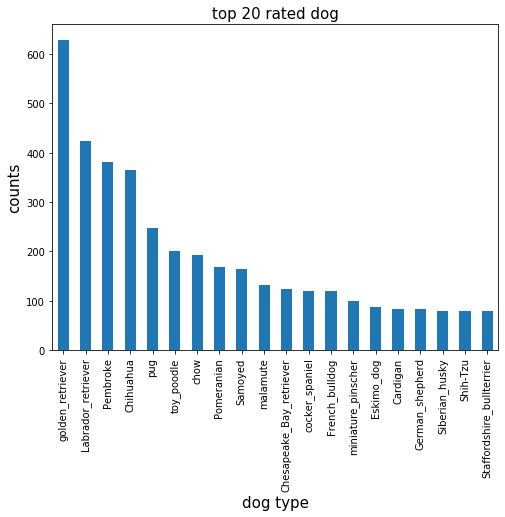

In [735]:
plt.figure(figsize =[8,6])

top20 = weratedog[weratedog['prediction'] != 'Error']

top20.prediction.value_counts().head(20).plot(kind = 'bar')

plt.title('top 20 rated dog', size = 15)

plt.ylabel('counts', size = 15)

plt.xlabel('dog type', size = 15)

**insight 1: golden retriever, labrador and pembroke are the most 3 common rated types of dog.**

### Visualization 2: ratings vs retweets

Text(0.5, 1.0, 'rating vs retweets')

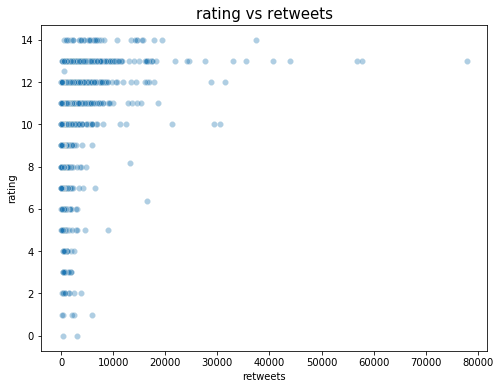

In [736]:
# using scatterplot to 
import seaborn as sns

plt.figure(figsize = [8,6])

sns.scatterplot(weratedog['retweets'],weratedog[weratedog['rating'] < 20]['rating']
                ,alpha = 0.1)

plt.title('rating vs retweets', size = 15)

**insight 2: overall, number of retweets goes up when rating goes up, however, the highest rating does not have highest counts.**

### Visualization 3: rating vs favorites



Text(0.5, 1.0, 'rating vs favorites')

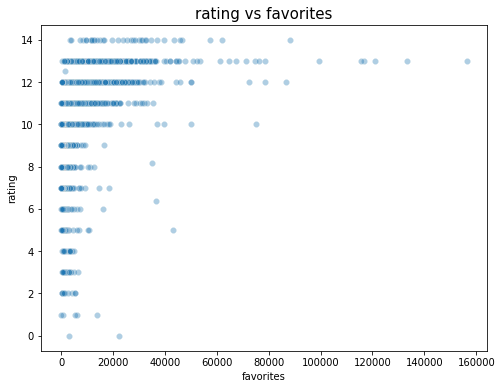

In [745]:
plt.figure(figsize = [8,6])

sns.scatterplot(weratedog['favorites'],weratedog[weratedog['rating'] < 20]['rating']
                ,alpha = 0.1)

plt.title('rating vs favorites', size = 15)

**insight 3: similar to rating vs retweets, overall, higher ratings lead to larger number of favorites**

### Visualization 4 retweets vs favorites

Text(0.5, 1.0, 'retweets vs favorites')

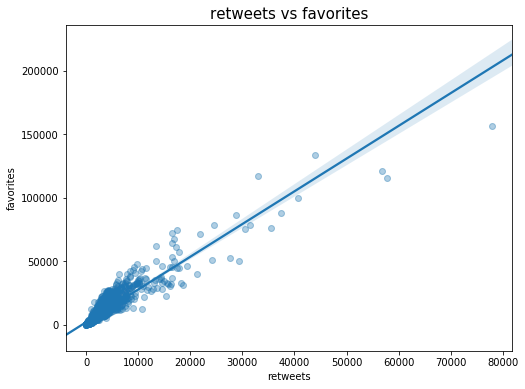

In [744]:
plt.figure(figsize =[8,6])

sns.regplot(data = weratedog, x = 'retweets', y = 'favorites', 
            x_jitter = 0.002, y_jitter = 0.002, scatter_kws={'alpha':1/10});

plt.title('retweets vs favorites', size = 15)

**insight 4: there is a positive correlation between retweets and favorites, dogs with higher favorites tend to have higher retweets. In this case retweets can be a good predictor of favorites.**